# Basic regression: use case "Pillar mat failure"


### Use seaborn for pairplot
!pip install -q seaborn

### Use some functions from tensorflow_docs
!pip install -q git+https://github.com/tensorflow/docs

## This example uses the tf.keras API, see this guide for details.

In [72]:
from __future__ import absolute_import, division, print_function, unicode_literals

import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [73]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

print(tf.__version__)

2.1.0


In [74]:
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

## The dataset
- The dataset is available from the UCI Machine Learning Repository.

### Get the data

In [75]:
#dataset_path = keras.utils.get_file("auto-mpg.data", "http://archive.ics.uci.edu/ml/machine-learning-databases/auto-mpg/auto-mpg.data")
dataset = pd.read_csv(r'Y:\CON_2019_HMC_PGD-MINESET\simple_model\local_30mm_lsopt_result_5int\summary_script_area\area_failure.csv')
dataset

,PARTNO01,PARTNO02,PARTNO03,PARTNO04,PARTNO05,PARTNO06,PARTNO07,PARTNO08,PARTNO09,PARTNO10,...,PARTNO37,PARTNO38,PARTNO39,PARTNO40,PARTNO41,PARTNO42,PARTNO43,PARTNO44,PARTNO45,Arer_failure
0,590,780,1180,1180,590,590,980,780,780,980,...,1180,590,780,980,590,780,1180,1180,780,2430.00000
1,590,590,780,980,780,1180,980,780,1470,1180,...,980,780,590,980,980,980,1470,980,1180,2059.25000
2,1180,780,980,980,1180,780,780,590,1470,590,...,980,590,590,780,590,980,1470,590,980,2030.81250
3,980,980,1180,1180,1470,590,980,1470,1470,1470,...,1470,1180,590,590,1180,980,1180,980,1180,2425.87500
4,590,780,780,1470,590,1470,1470,980,1470,980,...,980,1470,780,1180,590,980,590,590,780,2440.84375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,1470,1470,980,590,590,980,780,980,590,590,...,980,1180,1470,1180,590,590,590,1470,1180,1671.00000
2396,590,590,980,780,1470,980,980,1180,1470,1470,...,1180,980,590,1180,590,590,590,980,590,1997.87500
2397,980,980,1470,1470,590,1470,590,780,780,590,...,1470,980,980,780,1180,590,590,780,980,604.06250
2398,780,980,590,780,1180,780,1470,590,1470,590,...,980,1180,780,1470,980,1470,780,1180,1470,2917.21875


In [76]:
dataset.columns

Index(['PARTNO01', 'PARTNO02', 'PARTNO03', 'PARTNO04', 'PARTNO05', 'PARTNO06',
       'PARTNO07', 'PARTNO08', 'PARTNO09', 'PARTNO10', 'PARTNO11', 'PARTNO12',
       'PARTNO13', 'PARTNO14', 'PARTNO15', 'PARTNO16', 'PARTNO17', 'PARTNO18',
       'PARTNO19', 'PARTNO20', 'PARTNO21', 'PARTNO22', 'PARTNO23', 'PARTNO24',
       'PARTNO25', 'PARTNO26', 'PARTNO27', 'PARTNO28', 'PARTNO29', 'PARTNO30',
       'PARTNO31', 'PARTNO32', 'PARTNO33', 'PARTNO34', 'PARTNO35', 'PARTNO36',
       'PARTNO37', 'PARTNO38', 'PARTNO39', 'PARTNO40', 'PARTNO41', 'PARTNO42',
       'PARTNO43', 'PARTNO44', 'PARTNO45', 'Arer_failure'],
      dtype='object')

In [77]:

column_names = dataset.columns
dataset = dataset.loc[:,column_names]
#dataset = raw_dataset
#dataset = dataset_path
dataset.head()

,PARTNO01,PARTNO02,PARTNO03,PARTNO04,PARTNO05,PARTNO06,PARTNO07,PARTNO08,PARTNO09,PARTNO10,...,PARTNO37,PARTNO38,PARTNO39,PARTNO40,PARTNO41,PARTNO42,PARTNO43,PARTNO44,PARTNO45,Arer_failure
0,590,780,1180,1180,590,590,980,780,780,980,...,1180,590,780,980,590,780,1180,1180,780,2430.00000
1,590,590,780,980,780,1180,980,780,1470,1180,...,980,780,590,980,980,980,1470,980,1180,2059.25000
2,1180,780,980,980,1180,780,780,590,1470,590,...,980,590,590,780,590,980,1470,590,980,2030.81250
3,980,980,1180,1180,1470,590,980,1470,1470,1470,...,1470,1180,590,590,1180,980,1180,980,1180,2425.87500
4,590,780,780,1470,590,1470,1470,980,1470,980,...,980,1470,780,1180,590,980,590,590,780,2440.84375


## Clean the data
- The dataset contains a few unknown values.

### 누락 데이터 포착 
#### isnull() or isna()
- 데이터프레임의 isnull 또는 isna 메서드를 사용하면 누락 데이터의 위치를 알 수 있다.
- 데이터가 많은 경우에는 일일히 볼 수 없으므로 sum 명령으로 누락데이터의 갯수를 셀 수 있다.

isnull().sum()  or isna().sum

In [78]:
dataset.isna().sum()

PARTNO01        0
PARTNO02        0
PARTNO03        0
PARTNO04        0
PARTNO05        0
PARTNO06        0
PARTNO07        0
PARTNO08        0
PARTNO09        0
PARTNO10        0
PARTNO11        0
PARTNO12        0
PARTNO13        0
PARTNO14        0
PARTNO15        0
PARTNO16        0
PARTNO17        0
PARTNO18        0
PARTNO19        0
PARTNO20        0
PARTNO21        0
PARTNO22        0
PARTNO23        0
PARTNO24        0
PARTNO25        0
PARTNO26        0
PARTNO27        0
PARTNO28        0
PARTNO29        0
PARTNO30        0
PARTNO31        0
PARTNO32        0
PARTNO33        0
PARTNO34        0
PARTNO35        0
PARTNO36        0
PARTNO37        0
PARTNO38        0
PARTNO39        0
PARTNO40        0
PARTNO41        0
PARTNO42        0
PARTNO43        0
PARTNO44        0
PARTNO45        0
Arer_failure    0
dtype: int64

#### missingno 패키지를 사용하면 누락데이터에 대한 시각화를 쉽게 할 수 있다. 


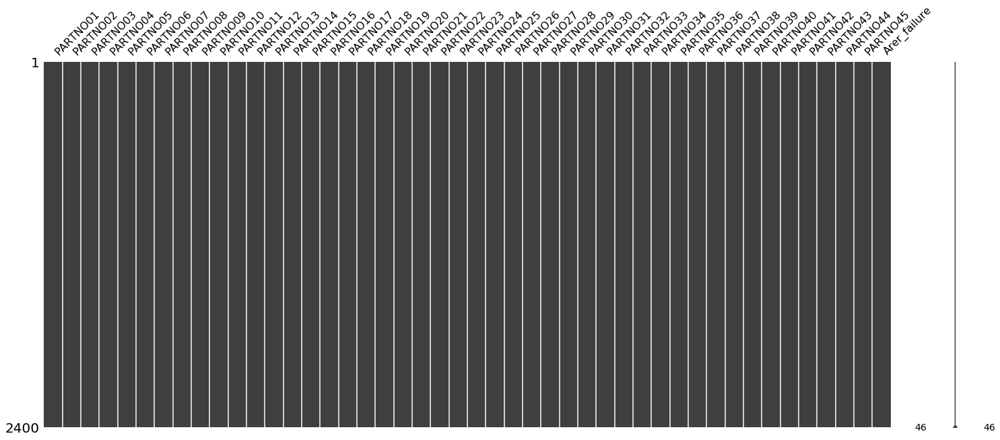

In [79]:
import missingno as msno

msno.matrix(dataset)
plt.show()

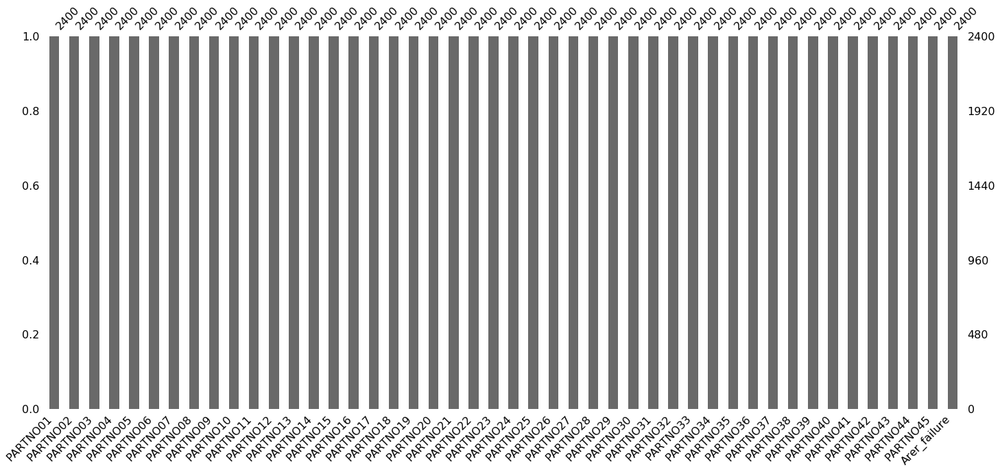

In [80]:
msno.bar(dataset)
plt.show()

### 누락 데이터 제거
-  dropna()명령을 사용하면 누락 데이터가 존재하는 행이나 열을 지울 수 있다.

In [81]:
dataset = dataset.dropna()

In [82]:
#dataset['Origin'] = dataset['Origin'].map({1: 'USA', 2: 'Europe', 3: 'Japan'})

In [83]:
dataset = pd.get_dummies(dataset, prefix='', prefix_sep='')
dataset.tail()

,PARTNO01,PARTNO02,PARTNO03,PARTNO04,PARTNO05,PARTNO06,PARTNO07,PARTNO08,PARTNO09,PARTNO10,...,PARTNO37,PARTNO38,PARTNO39,PARTNO40,PARTNO41,PARTNO42,PARTNO43,PARTNO44,PARTNO45,Arer_failure
2395,1470,1470,980,590,590,980,780,980,590,590,...,980,1180,1470,1180,590,590,590,1470,1180,1671.00000
2396,590,590,980,780,1470,980,980,1180,1470,1470,...,1180,980,590,1180,590,590,590,980,590,1997.87500
2397,980,980,1470,1470,590,1470,590,780,780,590,...,1470,980,980,780,1180,590,590,780,980,604.06250
2398,780,980,590,780,1180,780,1470,590,1470,590,...,980,1180,780,1470,980,1470,780,1180,1470,2917.21875
2399,780,980,780,980,1470,980,1180,590,780,980,...,980,980,980,1470,780,980,590,780,1470,1756.21875


### Split the data into train and test
- train: 80%, test 20%

In [84]:
train_dataset = dataset.sample(frac=0.8,random_state=0)
test_dataset = dataset.drop(train_dataset.index)

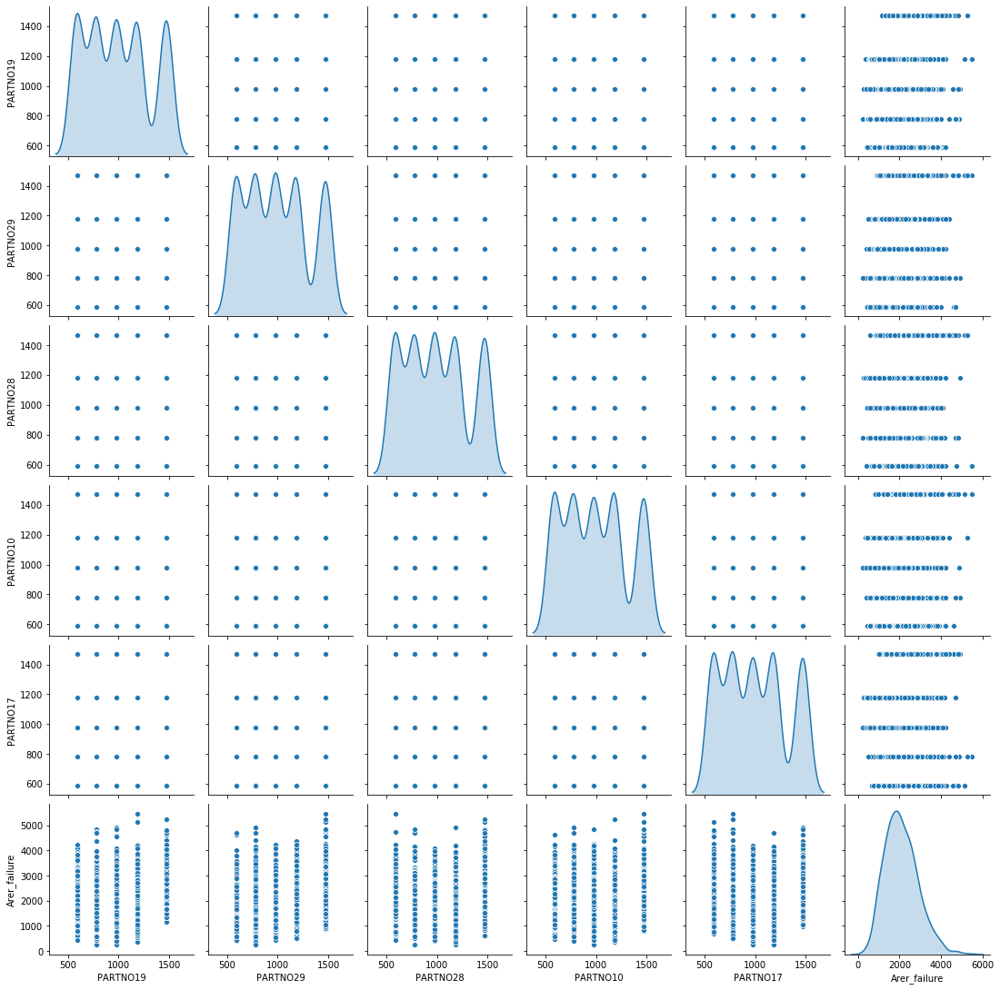

In [88]:
fig = sns.pairplot(train_dataset[["PARTNO19", "PARTNO29", "PARTNO28","PARTNO10","PARTNO17","Arer_failure"]], diag_kind="kde")
fig.savefig('foo.png')

### look at the overall statistics

In [86]:
plt.savefig('foo.png')

<Figure size 432x288 with 0 Axes>

In [89]:
train_stats = train_dataset.describe()
train_stats.pop("Arer_failure")
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
PARTNO01,1920.0,1001.921875,306.349183,590.0,780.0,980.0,1180.0,1470.0
PARTNO02,1920.0,998.786458,305.699100,590.0,780.0,980.0,1180.0,1470.0
PARTNO03,1920.0,998.734375,306.431515,590.0,780.0,980.0,1180.0,1470.0
PARTNO04,1920.0,1004.973958,305.740116,590.0,780.0,980.0,1180.0,1470.0
PARTNO05,1920.0,1003.078125,308.807409,590.0,780.0,980.0,1180.0,1470.0
PARTNO06,1920.0,1000.890625,306.387087,590.0,780.0,980.0,1180.0,1470.0
PARTNO07,1920.0,1002.104167,305.927118,590.0,780.0,980.0,1180.0,1470.0
PARTNO08,1920.0,997.520833,308.227124,590.0,780.0,980.0,1180.0,1470.0
PARTNO09,1920.0,996.000000,301.891277,590.0,780.0,980.0,1180.0,1470.0
PARTNO10,1920.0,999.572917,307.602006,590.0,780.0,980.0,1180.0,1470.0


### "Split features from labels"
- Separate the target value, or "label", from the features. This label is the value that you will train the model to predict.

In [90]:
train_labels = train_dataset.pop('Arer_failure')
test_labels = test_dataset.pop('Arer_failure')

### Normalize the data
- Look again at the train_stats block above and note how different the ranges of each feature are.
- It is good practice to normalize features that use different scales and ranges. 
- Although the model might converge without feature normalization, it makes training more difficult, and it makes the resulting model dependent on the choice of units used in the input.

In [91]:
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

### Build the model
- Let's build our model. Here, we'll use a Sequential model with two densely connected hidden layers, and an output layer that returns a single, continuous value. The model building steps are wrapped in a function, build_model, since we'll create a second model, later on.

#### tf.keras.Model.compile

model.compile(optimizer=tf.keras.optimizers.Adam(0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
              
- optimizer: 훈련 과정을 설정합니다. tf.keras.optimizers.Adam이나 tf.keras.optimizers.SGD와 같은 tf.keras.optimizers 아래의 옵티마이저 객체를 전달합니다. 기본 매개변수를 사용할 경우 'adam'이나 'sgd'와 같이 문자열로 지정할 수도 있습니다.
- loss: 최적화 과정에서 최소화될 손실 함수(loss function)를 설정합니다. 평균 제곱 오차(mse)와 categorical_crossentropy, sparse_categorical_crossentropy, binary_crossentropy 등이 자주 사용됩니다. 손실 함수의 이름을 지정하거나 tf.keras.losses 모듈 아래의 호출 가능한 객체를 전달할 수 있습니다.
- metrics: 훈련을 모니터링하기 위해 사용됩니다. 이름이나 tf.keras.metrics 모듈 아래의 호출 가능한 객체입니다.

In [92]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse', 'mape'])


  return model

In [93]:
model = build_model()

### Inspect the model

In [94]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 64)                2944      
_________________________________________________________________
dense_7 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 65        
Total params: 7,169
Trainable params: 7,169
Non-trainable params: 0
_________________________________________________________________


#### Take a batch of 10 examples from the training data and call model.predict on it.

- model.predict

In [95]:
example_batch = normed_train_data[:10]
example_result = model.predict(example_batch)
example_result

array([[ 1.0367053 ],
       [ 0.70552313],
       [ 0.8913082 ],
       [ 1.4966836 ],
       [ 0.38202012],
       [ 0.50734305],
       [-0.26021314],
       [ 1.2066975 ],
       [ 1.1725836 ],
       [ 0.18067178]], dtype=float32)

### Train the model
- 1000 epochs
#### epoch
- 한 번의 epoch는 인공 신경망에서 전체 데이터 셋에 대해 forward pass/backward pass 과정을 거친 것을 말함. 즉, 전체 데이터 셋에 대해 한 번 학습을 완료한 상태

In [96]:
EPOCHS = 1000

history = model.fit(
  normed_train_data, train_labels,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:4994118.2396,  mae:2091.9480,  mape:99.6338,  mse:4994118.5000,  val_loss:5132265.2917,  val_mae:2105.9612,  val_mape:99.2756,  val_mse:5132265.5000,  
....................................................................................................
Epoch: 100, loss:168515.8371,  mae:320.3866,  mape:18.5846,  mse:168515.7969,  val_loss:365880.3646,  val_mae:472.7680,  val_mape:27.0360,  val_mse:365880.3750,  
....................................................................................................
Epoch: 200, loss:91329.7007,  mae:238.8107,  mape:13.6718,  mse:91329.6953,  val_loss:379289.7812,  val_mae:480.6115,  val_mape:27.3473,  val_mse:379289.7812,  
....................................................................................................
Epoch: 300, loss:39060.5870,  mae:154.7639,  mape:8.9194,  mse:39060.5859,  val_loss:400103.7396,  val_mae:495.6667,  val_mape:28.3265,  val_mse:400103.7500,  
.............................................

In [97]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,mape,val_loss,val_mae,val_mse,val_mape,epoch
995,171.752023,10.269545,171.752014,0.542182,463355.914062,530.684326,463355.96875,29.661295,995
996,172.998451,10.294125,172.998428,0.547028,463311.250000,530.914490,463311.25000,29.681829,996
997,161.311730,9.863983,161.311707,0.510086,464280.320312,532.520081,464280.28125,29.780058,997
998,162.243799,9.965334,162.243820,0.523421,461246.437500,528.790955,461246.50000,29.478777,998
999,172.424990,10.248222,172.425003,0.544361,463147.351562,530.425293,463147.37500,29.606153,999


In [98]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [MIN_AREA]')

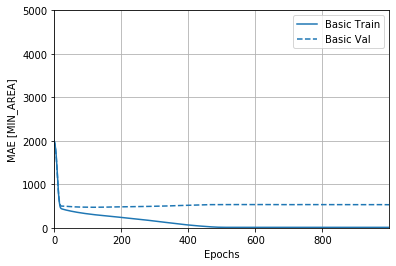

In [99]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 5000])
plt.ylabel('MAE [MIN_AREA]')

Text(0, 0.5, 'MSE [MIN_AREA^2]')

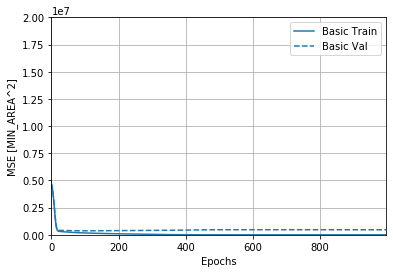

In [100]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 20000000])
plt.ylabel('MSE [MIN_AREA^2]')

In [101]:
model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])


Epoch: 0, loss:4995737.3698,  mae:2092.4055,  mape:99.6620,  mse:4995737.5000,  val_loss:5129390.5417,  val_mae:2105.4578,  val_mape:99.2560,  val_mse:5129390.5000,  
....................................................................................................
Epoch: 100, loss:160571.4414,  mae:310.6883,  mape:18.2270,  mse:160571.4219,  val_loss:378883.6211,  val_mae:485.1603,  val_mape:27.8153,  val_mse:378883.6562,  
...........

Text(0, 0.5, 'MAE [MIN_AREA]')

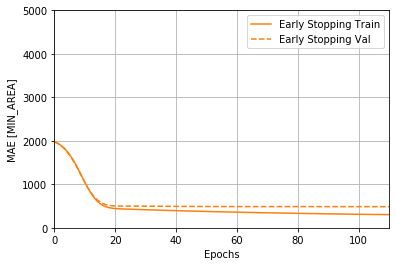

In [102]:
plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 5000])
plt.ylabel('MAE [MIN_AREA]')

In [103]:
loss, mae, mse, mape = model.evaluate(normed_test_data, test_labels, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} MIN_AREA".format(mae))

480/480 - 0s - loss: 350747.9229 - mae: 456.9547 - mse: 350747.9375 - mape: 25.9295
Testing set Mean Abs Error: 456.95 MIN_AREA


### Make predictions
- predict MIN_AREA values using data in the testing set

In [104]:
test_predictions = model.predict(normed_test_data).flatten()
f = open('F:\\CON_2019_HMC_PGD-MINESET\\First_model\\prediction.csv','w')
for i in range(0,len(test_predictions)):
    print(test_predictions[i])
    f.write(str(test_predictions[i])+',')
f.close()
print(test_predictions)


2420.97
2256.0518
1761.628
1949.9186
2392.5532
2225.7676
1521.3132
2066.2073
1629.9962
2382.7568
2422.812
2971.7417
1878.5244
1525.9271
1851.3497
2060.254
3223.4438
1233.9816
2501.2593
2562.727
2817.498
2044.3995
3115.7905
1515.6836
2298.9097
1572.0743
3246.7153
1663.6122
2733.079
1315.5065
2602.6697
2496.7822
2218.2632
1159.941
2082.0435
1832.7902
2593.8481
2259.436
2532.8835
1735.6017
1150.215
1737.7819
2673.5469
1883.1862
1618.5709
1705.2454
2357.392
1238.6373
1366.3003
2200.2864
2578.308
2857.6335
3076.0361
2142.7043
2396.0042
1717.5721
3099.9517
2136.3252
1561.5712
2286.982
2188.3052
2207.8247
1467.1522
2528.811
1030.9586
2562.9858
2458.081
2262.3828
2713.109
1969.8485
2297.4968
2996.0815
2707.1165
1050.1947
2264.2056
2394.4521
1668.0135
3000.8164
1439.4098
2032.4355
2024.4332
2927.8496
1602.7479
2041.1173
1189.036
2034.723
2335.3928
2502.4795
1382.9684
2013.7032
1802.8766
2146.0981
1778.8708
3028.0427
1640.768
1885.1483
2776.2832
1925.1957
1547.5814
2035.008
2403.7231
2744.899
22

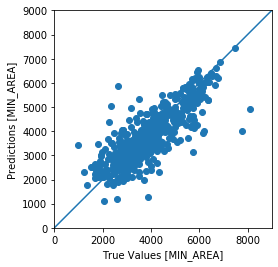

In [65]:
a = plt.axes(aspect='equal')
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [MIN_AREA]')
plt.ylabel('Predictions [MIN_AREA]')
lims = [0, 9000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

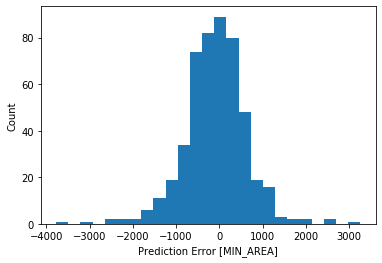

In [66]:
error = test_predictions - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Prediction Error [MIN_AREA]")
_ = plt.ylabel("Count")

In [ ]:
model.summary()

# add sPGD result

In [106]:
#dataset_path = keras.utils.get_file("auto-mpg.data", "http://archive.ics.uci.edu/ml/machine-learning-databases/auto-mpg/auto-mpg.data")
dataset = pd.read_csv(r'Y:\CON_2019_HMC_PGD-MINESET\simple_model\local_30mm_lsopt_result_5int\predict_data_BPLR_finalArea.csv')
dataset

,PARTNO01,PARTNO02,PARTNO03,PARTNO04,PARTNO05,PARTNO06,PARTNO07,PARTNO08,PARTNO09,PARTNO10,...,PARTNO37,PARTNO38,PARTNO39,PARTNO40,PARTNO41,PARTNO42,PARTNO43,PARTNO44,PARTNO45,Area_failure
0,927,1289,1130,851,902,1010,1083,845,722,707,...,841,1103,631,1127,1170,810,1137,1112,1270,1714.165052
1,1124,688,1193,1001,1022,1037,1129,891,1106,1394,...,829,618,638,1198,1125,1064,750,860,1236,2503.798817
2,1087,783,938,1111,1282,833,1109,1220,1111,1337,...,894,882,865,702,859,1258,1299,1188,767,2110.577248
3,1023,1311,948,609,1181,694,1005,761,802,1332,...,1168,1071,1260,982,1201,938,1008,969,599,1903.343247
4,880,1120,612,953,833,878,711,1380,593,631,...,1120,1168,1151,1175,672,1045,825,704,638,1628.208291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,902,1072,805,895,1227,927,1075,660,791,1384,...,704,835,855,1251,724,1041,1363,1248,1171,2424.166838
2396,1118,999,1397,877,1399,973,1162,723,826,1330,...,963,1200,1052,987,643,790,830,1192,1133,2295.133547
2397,1265,716,869,624,840,691,1170,713,1105,977,...,959,1111,946,931,1296,851,886,1024,1234,2275.752322
2398,965,836,1055,1221,621,1256,882,961,1305,1131,...,1129,633,1156,1258,903,1386,1346,988,946,1911.964838


In [107]:
column_names = dataset.columns
dataset = dataset.loc[:,column_names]
#dataset = raw_dataset
#dataset = dataset_path
dataset.head()

,PARTNO01,PARTNO02,PARTNO03,PARTNO04,PARTNO05,PARTNO06,PARTNO07,PARTNO08,PARTNO09,PARTNO10,...,PARTNO37,PARTNO38,PARTNO39,PARTNO40,PARTNO41,PARTNO42,PARTNO43,PARTNO44,PARTNO45,Area_failure
0,927,1289,1130,851,902,1010,1083,845,722,707,...,841,1103,631,1127,1170,810,1137,1112,1270,1714.165052
1,1124,688,1193,1001,1022,1037,1129,891,1106,1394,...,829,618,638,1198,1125,1064,750,860,1236,2503.798817
2,1087,783,938,1111,1282,833,1109,1220,1111,1337,...,894,882,865,702,859,1258,1299,1188,767,2110.577248
3,1023,1311,948,609,1181,694,1005,761,802,1332,...,1168,1071,1260,982,1201,938,1008,969,599,1903.343247
4,880,1120,612,953,833,878,711,1380,593,631,...,1120,1168,1151,1175,672,1045,825,704,638,1628.208291


In [108]:
dataset = pd.get_dummies(dataset, prefix='', prefix_sep='')
dataset.head()

,PARTNO01,PARTNO02,PARTNO03,PARTNO04,PARTNO05,PARTNO06,PARTNO07,PARTNO08,PARTNO09,PARTNO10,...,PARTNO37,PARTNO38,PARTNO39,PARTNO40,PARTNO41,PARTNO42,PARTNO43,PARTNO44,PARTNO45,Area_failure
0,927,1289,1130,851,902,1010,1083,845,722,707,...,841,1103,631,1127,1170,810,1137,1112,1270,1714.165052
1,1124,688,1193,1001,1022,1037,1129,891,1106,1394,...,829,618,638,1198,1125,1064,750,860,1236,2503.798817
2,1087,783,938,1111,1282,833,1109,1220,1111,1337,...,894,882,865,702,859,1258,1299,1188,767,2110.577248
3,1023,1311,948,609,1181,694,1005,761,802,1332,...,1168,1071,1260,982,1201,938,1008,969,599,1903.343247
4,880,1120,612,953,833,878,711,1380,593,631,...,1120,1168,1151,1175,672,1045,825,704,638,1628.208291


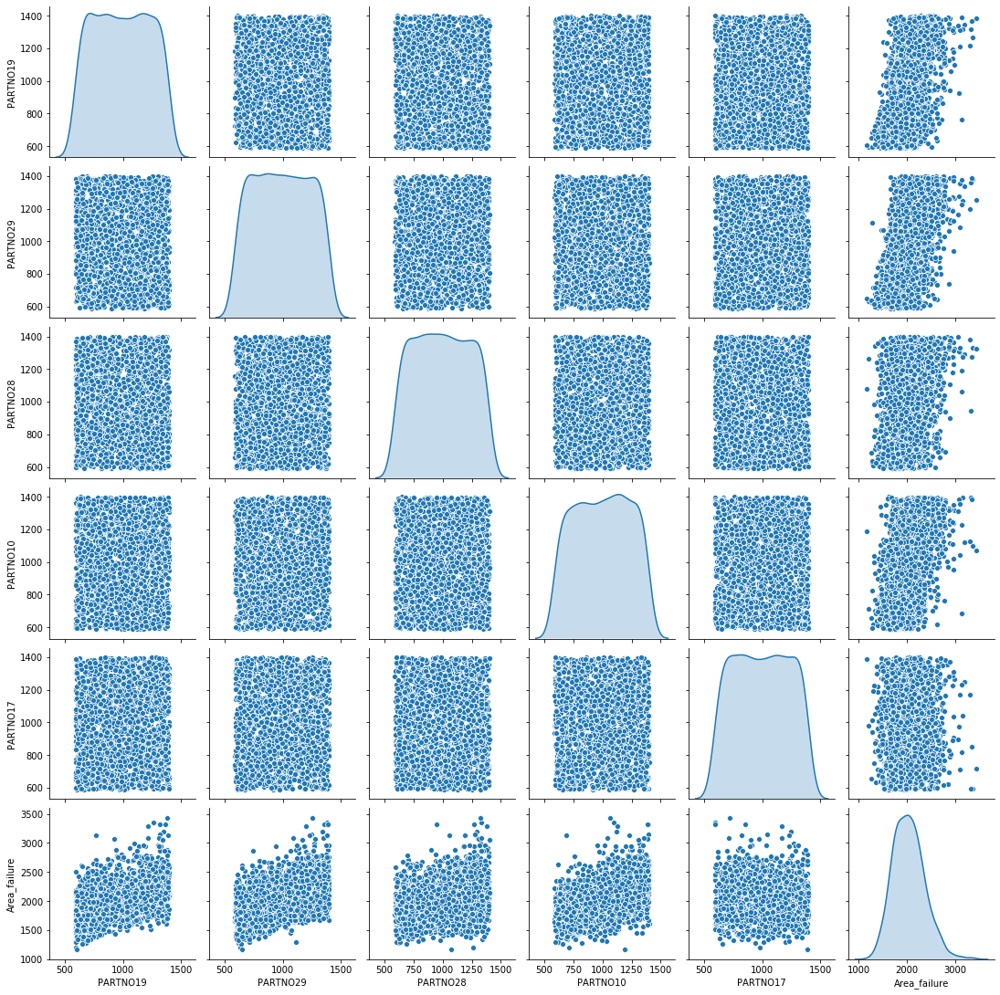

In [109]:
train_dataset = dataset.sample(frac=0.8,random_state=0)
test_dataset = dataset.drop(train_dataset.index)	

fig = sns.pairplot(train_dataset[["PARTNO19", "PARTNO29", "PARTNO28","PARTNO10","PARTNO17","Area_failure"]], diag_kind="kde")	
fig.savefig('foo.png')

In [111]:
train_stats = train_dataset.describe()
train_stats.pop("Area_failure")
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
PARTNO01,1920.0,994.999479,232.587430,590.0,796.00,988.0,1199.00,1399.0
PARTNO02,1920.0,994.956771,234.069910,590.0,790.00,997.5,1197.00,1399.0
PARTNO03,1920.0,996.177083,231.429250,590.0,798.00,995.0,1195.00,1399.0
PARTNO04,1920.0,993.645833,232.582091,590.0,791.00,995.5,1193.25,1399.0
PARTNO05,1920.0,998.825000,235.742941,590.0,794.75,1001.0,1206.25,1399.0
PARTNO06,1920.0,992.931250,232.610754,590.0,791.75,993.5,1193.00,1399.0
PARTNO07,1920.0,994.049479,233.522290,590.0,792.00,991.0,1199.25,1399.0
PARTNO08,1920.0,991.698437,233.055395,590.0,790.00,990.0,1190.25,1399.0
PARTNO09,1920.0,988.929688,235.171652,590.0,784.75,986.0,1192.25,1399.0
PARTNO10,1920.0,999.807812,233.114191,590.0,801.00,1004.5,1198.25,1399.0


In [112]:
train_labels = train_dataset.pop('Area_failure')
test_labels = test_dataset.pop('Area_failure')

def norm(x):
  return (x - train_stats['mean']) / train_stats['std']
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [113]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])
  optimizer = tf.keras.optimizers.RMSprop(0.001)
  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse', 'mape'])
  return model

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 64)                2944      
_________________________________________________________________
dense_10 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 65        
Total params: 7,169
Trainable params: 7,169
Non-trainable params: 0
_________________________________________________________________


In [114]:
example_batch = normed_train_data[:10]
example_result = model.predict(example_batch)
example_result

array([[2473.7148],
       [1771.373 ],
       [4311.0015],
       [1264.5647],
       [2981.154 ],
       [2396.1936],
       [2854.6523],
       [1816.483 ],
       [1507.4291],
       [2007.6989]], dtype=float32)

In [115]:
EPOCHS = 1000

history = model.fit(
  normed_train_data, train_labels,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])



Epoch: 0, loss:129367.7933,  mae:288.7542,  mape:14.4740,  mse:129367.8047,  val_loss:94054.9183,  val_mae:250.2863,  val_mape:12.5595,  val_mse:94054.9141,  
....................................................................................................
Epoch: 100, loss:3321.9275,  mae:45.4805,  mape:2.2762,  mse:3321.9270,  val_loss:34500.2287,  val_mae:141.9091,  val_mape:7.1152,  val_mse:34500.2305,  
....................................................................................................
Epoch: 200, loss:581.4178,  mae:18.8358,  mape:0.9406,  mse:581.4178,  val_loss:35086.4089,  val_mae:142.7229,  val_mape:7.1631,  val_mse:35086.4102,  
....................................................................................................
Epoch: 300, loss:82.1182,  mae:7.1949,  mape:0.3592,  mse:82.1182,  val_loss:37623.9904,  val_mae:148.0056,  val_mape:7.4213,  val_mse:37623.9883,  
..................................................................................

## MAE refers to Mean Absolute Error
## MAPE refers to Mean Absolute Percentage Error
## MSE refers to Mean Squared Error

In [116]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()


,loss,mae,mse,mape,val_loss,val_mae,val_mse,val_mape,epoch
995,64.541972,6.115402,64.541962,0.300293,37930.637695,148.414505,37930.636719,7.442648,995
996,54.713829,5.840046,54.713833,0.288824,38290.177572,148.602188,38290.175781,7.450752,996
997,60.483379,6.136054,60.483379,0.303768,38062.333984,147.869019,38062.335938,7.420998,997
998,53.279094,5.689637,53.279087,0.280997,39516.826823,151.609497,39516.824219,7.624573,998
999,66.960571,6.376147,66.960579,0.314200,38393.448405,149.045349,38393.449219,7.486876,999


Text(0, 0.5, 'MAPE [MIN_AREA]')

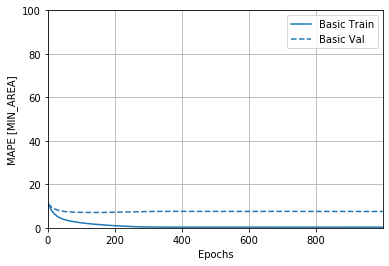

In [121]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({'Basic': history}, metric = "mape")
plt.ylim([0, 100])
plt.ylabel('MAPE [MIN_AREA]')


Text(0, 0.5, 'MAE [MIN_AREA]')

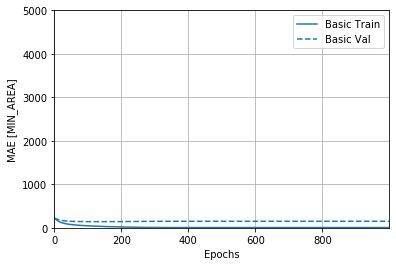

In [122]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 5000])
plt.ylabel('MAE [MIN_AREA]')


In [123]:
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])



Epoch: 0, loss:56.8131,  mae:5.8470,  mape:0.2885,  mse:56.8131,  val_loss:38827.3379,  val_mae:149.9737,  val_mape:7.5331,  val_mse:38827.3359,  
.................

Text(0, 0.5, 'MAPE [MIN_AREA]')

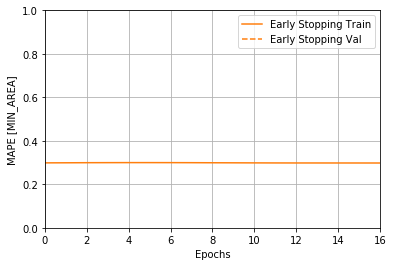

In [130]:
plotter.plot({'Early Stopping': early_history}, metric = "mape")
plt.ylim([0, 1])
plt.ylabel('MAPE [MIN_AREA]')



In [131]:
loss, mae, mse, mape = model.evaluate(normed_test_data, test_labels, verbose=2)
print("Testing set Mean Abs Error: {:5.2f} MIN_AREA".format(mae))

480/480 - 0s - loss: 41570.2648 - mae: 158.2491 - mse: 41570.2617 - mape: 8.0050
Testing set Mean Abs Error: 158.25 MIN_AREA


In [132]:
test_predictions = model.predict(normed_test_data).flatten()
f = open(r'Y:\CON_2019_HMC_PGD-MINESET\simple_model\local_30mm_lsopt_result_5int\prediction.csv','w')
for i in range(0,len(test_predictions)):
    #print(test_predictions[i])
    f.write(str(test_predictions[i])+',')
f.close()
#print(test_predictions)


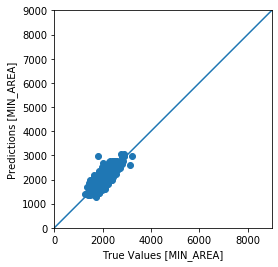

In [133]:
a = plt.axes(aspect='equal')
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [MIN_AREA]')
plt.ylabel('Predictions [MIN_AREA]')
lims = [0, 9000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)	

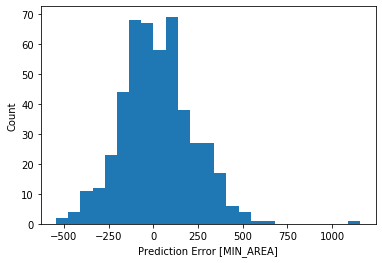

In [134]:
error = test_predictions - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Prediction Error [MIN_AREA]")
_ = plt.ylabel("Count")	